<center> 
    <a href="https://www.visual-layer.com" target="_blank" rel="noopener noreferrer">
    <picture>
    <source media="(prefers-color-scheme: dark)" srcset="https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo_dark_mode.png" width=200>
    <source media="(prefers-color-scheme: light)" srcset="https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo.png" width=200>
    <img alt="vl logo." src="https://raw.githubusercontent.com/visual-layer/fastdup/main/gallery/visual_layer_logo.png" width=400>
    </picture>
    </a><br>
    <a href="https://github.com/visual-layer/fastdup" target="_blank" style="text-decoration: none;"> GitHub </a> •
    <a href="https://visual-layer.slack.com/" target="_blank" style="text-decoration: none;"> Join Community </a> •
    <a href="https://visual-layer.readme.io/discuss" target="_blank" style="text-decoration: none;"> Discussion Forum </a>
</center>

<center> 
    <a href="https://medium.com/visual-layer" target="_blank" style="text-decoration: none;"> Blog </a> •
    <a href="https://visual-layer.readme.io/" target="_blank" style="text-decoration: none;"> Documentation </a> •
    <a href="https://visual-layer.com/about" target="_blank" style="text-decoration: none;"> About Us </a> 
</center>


<br>

<center> 
<div style="text-align: center; margin-top:50px;">
    <a href="https://visual-layer.com/" style="padding:10px;">
                <img alt="site" src="https://vl-blog.s3.us-east-2.amazonaws.com/imgs/web.png" width="50"></a>
    <a href="https://medium.com/visual-layer" style="padding:10px;">
                <img alt="blog" src="https://vl-blog.s3.us-east-2.amazonaws.com/imgs/forum.png" width="50"></a>
    <a href="https://github.com/visual-layer/fastdup" style="padding:10px;">
                <img alt="github" src="https://vl-blog.s3.us-east-2.amazonaws.com/imgs/github.png" width="50"></a>
    <a href="https://visual-layer.slack.com/" style="padding:10px;">
                <img alt="slack" src="https://vl-blog.s3.us-east-2.amazonaws.com/imgs/slack.png" width="50"></a>
    <a href="https://www.linkedin.com/company/visual-layer/" style="padding:10px;">
                <img alt="linkedin" src="https://vl-blog.s3.us-east-2.amazonaws.com/imgs/linkedin.png" width="50"></a>
    <a href="https://www.youtube.com/@visual-layer" style="padding:10px;">
                <img alt="youtube" src="https://vl-blog.s3.us-east-2.amazonaws.com/imgs/youtube.png" width="50"></a>
    <a href="https://twitter.com/visual_layer" style="padding:10px;">
                <img alt="twitter" src="https://vl-blog.s3.us-east-2.amazonaws.com/imgs/x.png" width="50"></a>
</div>
</center>

# Enrich Dataset with Hugging Face Models

[![Open in Colab](https://img.shields.io/badge/Open%20in%20Colab-blue?style=for-the-badge&logo=google-colab&labelColor=gray)](https://colab.research.google.com/github/visual-layer/fastdup/blob/main/examples/quick-dataset-analysis.ipynb)
[![Open in Kaggle](https://img.shields.io/badge/Open%20in%20Kaggle-blue?style=for-the-badge&logo=kaggle&labelColor=gray)](https://kaggle.com/kernels/welcome?src=https://github.com/visual-layer/fastdup/blob/main/examples/quick-dataset-analysis.ipynb)
[![Explore the Docs](https://img.shields.io/badge/Explore%20the%20Docs-blue?style=for-the-badge&labelColor=gray&logo=read-the-docs)](https://visual-layer.readme.io/docs/enrichment-zero-shot-detection)

This notebook shows how to enrich your image dataset using off the shelve models from Hugging Face hub.

By the end of this notebook, you will learn how to find out if your dataset has issues such as:

+ Use object detection models
+ Use zero shot models
  

## Hugging Face Pre-trained Object Detection Models

First load the models using the `pipeline` API from Hugging Face.


Available models:
- `"facebook/detr-resnet-50" `
- `"microsoft/conditional-detr-resnet-50"`
- `"SenseTime/deformable-detr"` 
- `"jozhang97/deta-swin-large"`
- `"microsoft/table-transformer-detection"` 
- `"hustvl/yolos-tiny"`

In [1]:
from transformers import pipeline

model = "facebook/detr-resnet-50"
detector = pipeline(model=model, task="object-detection", device="cuda")

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Load images from folder into a DataFrame using fastdup's builtin function.

In [2]:
import pandas as pd
from tqdm.auto import tqdm

import fastdup
from fastdup.utils import get_images_from_path

fd = fastdup.create(input_dir="/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k")
filenames = get_images_from_path(fd.input_dir)

filename_df = pd.DataFrame(filenames, columns=["filename"])
filename_df = filename_df.sample(100)
filename_df

,filename
835,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/fastdup_report_bbox/crops/imagestrain2017000000022411.jpg_162_304_262_475.jpg
95508,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/processing/step_fastdup/images/thumbnails/24/thumbs_a3711cb2-1e49-11ef-8b66-fc3497b6f70f.jpg.webp
105887,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/processing/step_fastdup/images/thumbnails/1/thumbs_a1fe6510-1e49-11ef-87c7-fc3497b6f70f.jpg.webp
82287,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/processing/step_fastdup/images/thumbnails/11/thumbs_a25c94c8-1e49-11ef-8c7f-fc3497b6f70f.jpg.webp
58373,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/input/images/24/a3492a86-1e49-11ef-8b66-fc3497b6f70f.jpg
...,...
84280,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/processing/step_fastdup/images/thumbnails/3/thumbs_a21757fa-1e49-11ef-80b2-fc3497b6f70f.jpg.webp
45287,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/input/images/11/a26d482c-1e49-11ef-8c7f-fc3497b6f70f.jpg
56388,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/input/images/34/a3c24ed4-1e49-11ef-9e18-fc3497b6f70f.jpg
50335,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/input/images/19/a28f87fc-1e49-11ef-a2b2-fc3497b6f70f.jpg


Run batch inference on the DataFrame of images using the model.

In [3]:
batch_size = 8
results = []

for start in tqdm(range(0, len(filename_df), batch_size), desc="Batch inference"):
    end = start + batch_size

    batch = filename_df[start:end]
    batch = batch["filename"].tolist()
    res = detector(batch, device="cuda")
    results.extend(res)

Batch inference:   0%|          | 0/13 [00:00<?, ?it/s]

/home/dnth/anaconda3/envs/fastdup-hf/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1695392020201/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


In [4]:
def process_detection_results(
    results: list[list], filename_df: pd.DataFrame
) -> pd.DataFrame:
    results_dict = {"boxes": [], "labels": [], "scores": []}

    for result in results:
        scores = [item["score"] for item in result]
        labels = [item["label"] for item in result]

        boxes_xyxy = []
        for item in result:
            xmin = item["box"]["xmin"]
            ymin = item["box"]["ymin"]
            xmax = item["box"]["xmax"]
            ymax = item["box"]["ymax"]
            box = (xmin, ymin, xmax, ymax)
            boxes_xyxy.append(box)

        results_dict["boxes"].append(boxes_xyxy)
        results_dict["labels"].append(labels)
        results_dict["scores"].append(scores)

    results_df = pd.DataFrame(results_dict)

    filename_df = filename_df.reset_index(drop=True)
    results_df = pd.concat([filename_df, results_df], axis=1)

    return results_df


results_df = process_detection_results(results, filename_df)

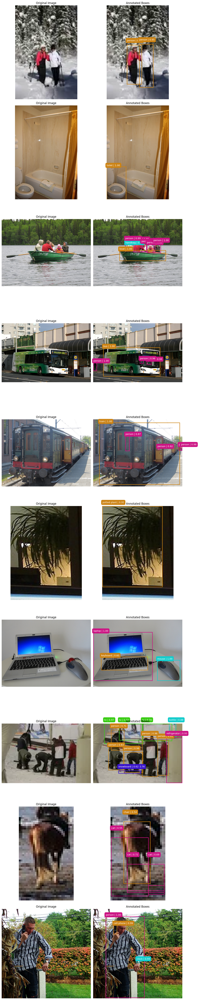

In [5]:
from fastdup.models_utils import plot_annotations

plot_annotations(
    results_df.sample(10),
    image_col="filename",
    bbox_col="boxes",
    scores_col="scores",
    labels_col="labels",
    num_rows=10,
)

## Hugging Face Zero-Shot Object Detection Models

Available models:

+ `"google/owlvit-base-patch32"`
+ `"google/owlvit-base-patch16"`
+ `"google/owlvit-large-patch14"`
+ `"google/owlv2-base-patch16"`
+ `"google/owlv2-base-patch16-ensemble"`
+ `"google/owlv2-large-patch14-ensemble"`
+ `"google/owlv2-large-patch14-finetuned"`
+ `"google/owlv2-base-patch16-finetuned"`
+ `"IDEA-Research/grounding-dino-tiny"`
+ `"IDEA-Research/grounding-dino-base"`

In [16]:
detector = pipeline(model="google/owlv2-large-patch14-finetuned", task="zero-shot-object-detection", device="cuda")

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.75G [00:00<?, ?B/s]

/home/dnth/anaconda3/envs/fastdup-hf/lib/python3.10/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


tokenizer_config.json:   0%|          | 0.00/1.10k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/67.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/121 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/427 [00:00<?, ?B/s]

In [17]:
filename_df

,filename
835,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/fastdup_report_bbox/crops/imagestrain2017000000022411.jpg_162_304_262_475.jpg
95508,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/processing/step_fastdup/images/thumbnails/24/thumbs_a3711cb2-1e49-11ef-8b66-fc3497b6f70f.jpg.webp
105887,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/processing/step_fastdup/images/thumbnails/1/thumbs_a1fe6510-1e49-11ef-87c7-fc3497b6f70f.jpg.webp
82287,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/processing/step_fastdup/images/thumbnails/11/thumbs_a25c94c8-1e49-11ef-8c7f-fc3497b6f70f.jpg.webp
58373,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/input/images/24/a3492a86-1e49-11ef-8b66-fc3497b6f70f.jpg
...,...
84280,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/processing/step_fastdup/images/thumbnails/3/thumbs_a21757fa-1e49-11ef-80b2-fc3497b6f70f.jpg.webp
45287,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/input/images/11/a26d482c-1e49-11ef-8c7f-fc3497b6f70f.jpg
56388,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/input/images/34/a3c24ed4-1e49-11ef-9e18-fc3497b6f70f.jpg
50335,/media/dnth/CODE_DATASET2/cocomini/coco_minitrain_25k/work_dir/input/images/19/a28f87fc-1e49-11ef-a2b2-fc3497b6f70f.jpg


In [18]:
results = []

for row in tqdm(filename_df.itertuples(), total=len(filename_df), desc="Running Inference"):
    filename = row.filename
    res = detector(filename, candidate_labels=["human face", "car", "giraffe", "bike"], device="cuda")
    results.append(res)

Running Inference:   0%|          | 0/100 [00:00<?, ?it/s]

In [19]:
results_df = process_detection_results(results, filename_df)

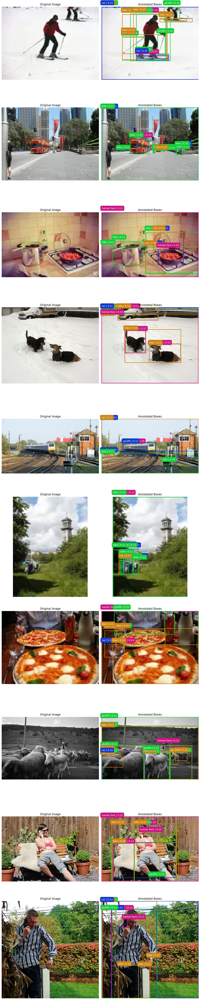

In [15]:
plot_annotations(
    results_df.sample(10),
    image_col="filename",
    bbox_col="boxes",
    scores_col="scores",
    labels_col="labels",
    num_rows=10,
)

## Hugging Face Pre-trained Image Classification Models

In [26]:
classifier = pipeline(model="google/vit-base-patch16-224", task="image-classification", device="cuda")

config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

In [36]:
batch_size = 8
results = []

for start in tqdm(range(0, len(filename_df), batch_size), desc="Batch inference"):
    end = start + batch_size

    batch = filename_df[start:end]
    batch = batch["filename"].tolist()
    res = classifier(batch)
    results.extend(res)

Batch inference:   0%|          | 0/13 [00:00<?, ?it/s]

In [37]:
def process_classification_results(results: list[list], filename_df: pd.DataFrame) -> pd.DataFrame:
    results_dict = {"labels": [], "scores": []}

    for result in results:
        scores = [item["score"] for item in result]
        labels = [item["label"] for item in result]

        results_dict["labels"].append(labels)
        results_dict["scores"].append(scores)

    results_df = pd.DataFrame(results_dict)

    filename_df = filename_df.reset_index(drop=True)
    results_df = pd.concat([filename_df, results_df], axis=1)

    return results_df


In [41]:
results_df = process_classification_results(results, filename_df)

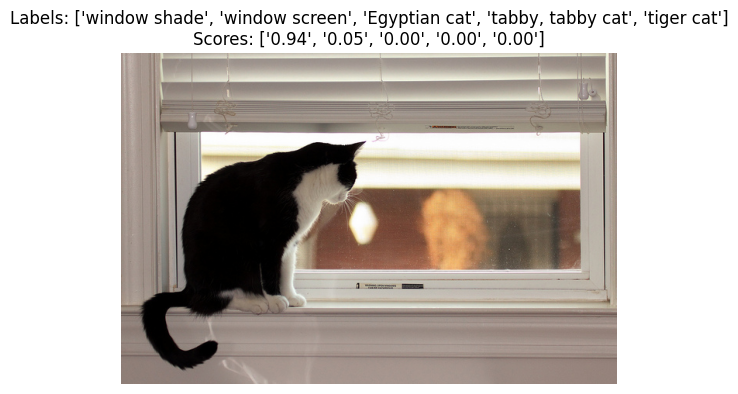

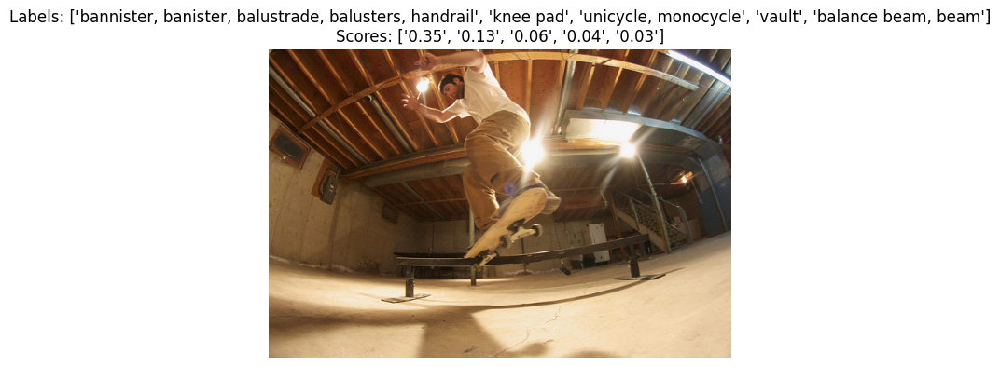

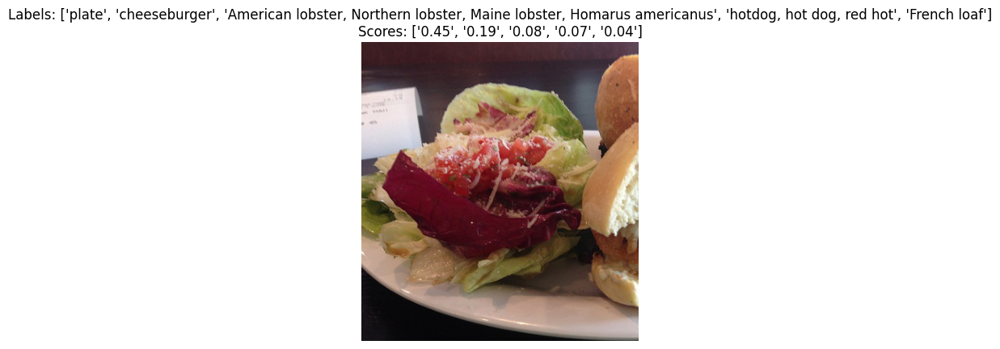

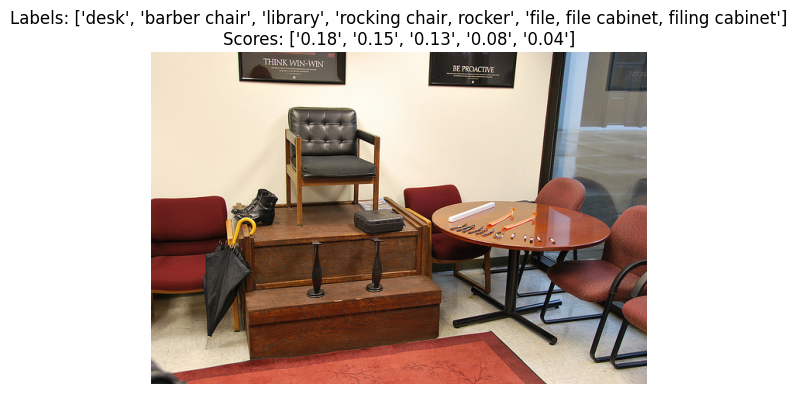

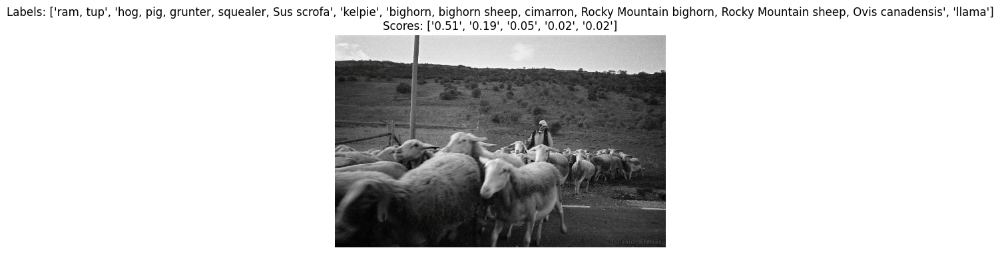

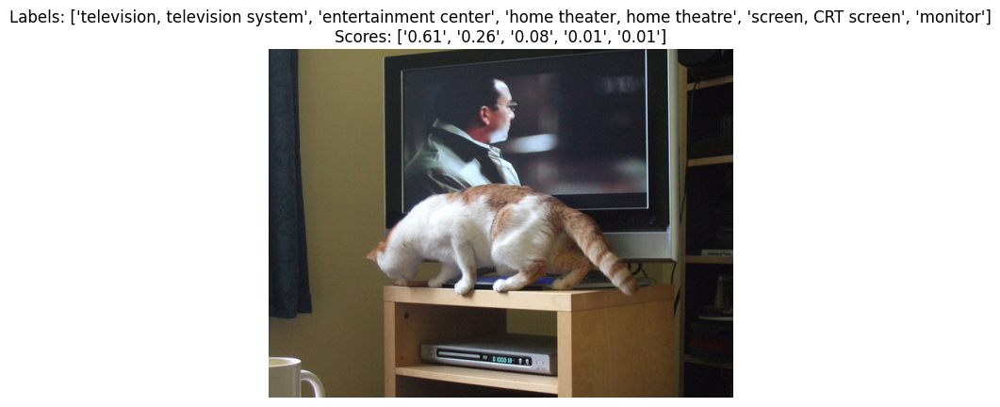

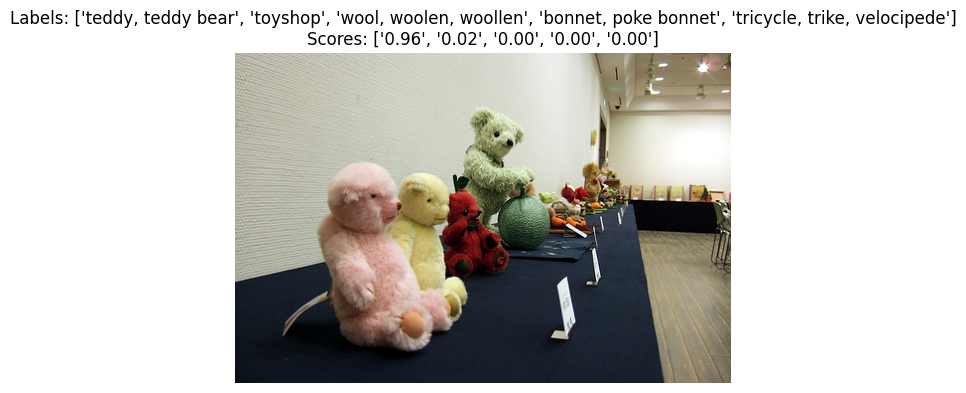

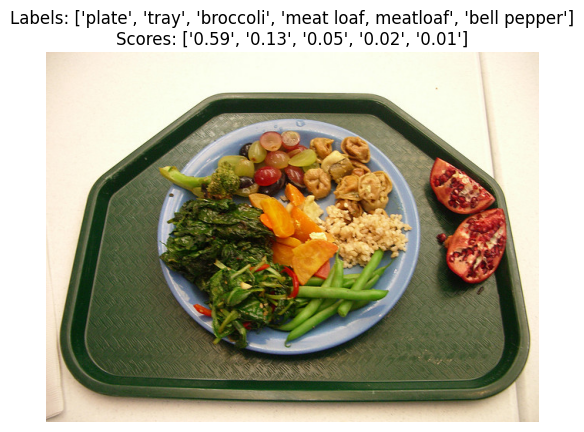

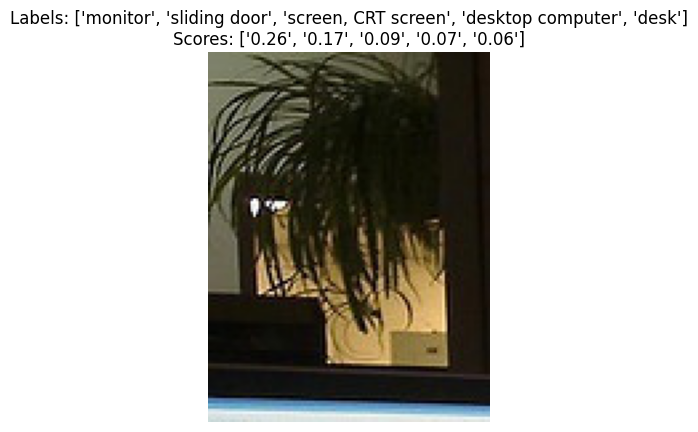

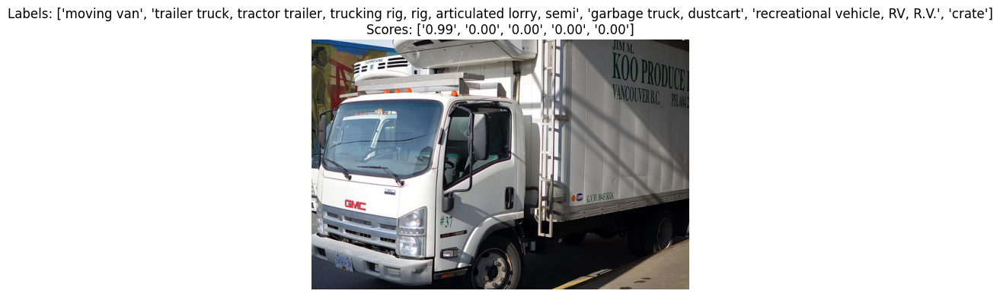

In [46]:
import matplotlib.pyplot as plt
from PIL import Image

for index, row in results_df.sample(10).iterrows():
    filename = row['filename']
    labels = row['labels']
    scores = row['scores']
    
    image = Image.open(filename)
    
    # Plot the image
    plt.imshow(image)
    plt.title(f"Labels: {labels}\nScores: {[f'{score:.2f}' for score in scores]}")
    plt.axis('off')
    
    plt.show()
    plt.close()


<center> 
<div style="text-align: center; margin-top:50px;">
    <a href="https://visual-layer.com/" style="padding:10px;">
                <img alt="site" src="https://vl-blog.s3.us-east-2.amazonaws.com/imgs/web.png" width="50"></a>
    <a href="https://medium.com/visual-layer" style="padding:10px;">
                <img alt="blog" src="https://vl-blog.s3.us-east-2.amazonaws.com/imgs/forum.png" width="50"></a>
    <a href="https://github.com/visual-layer/fastdup" style="padding:10px;">
                <img alt="github" src="https://vl-blog.s3.us-east-2.amazonaws.com/imgs/github.png" width="50"></a>
    <a href="https://visual-layer.slack.com/" style="padding:10px;">
                <img alt="slack" src="https://vl-blog.s3.us-east-2.amazonaws.com/imgs/slack.png" width="50"></a>
    <a href="https://www.linkedin.com/company/visual-layer/" style="padding:10px;">
                <img alt="linkedin" src="https://vl-blog.s3.us-east-2.amazonaws.com/imgs/linkedin.png" width="50"></a>
    <a href="https://www.youtube.com/@visual-layer" style="padding:10px;">
                <img alt="youtube" src="https://vl-blog.s3.us-east-2.amazonaws.com/imgs/youtube.png" width="50"></a>
    <a href="https://twitter.com/visual_layer" style="padding:10px;">
                <img alt="twitter" src="https://vl-blog.s3.us-east-2.amazonaws.com/imgs/x.png" width="50"></a>
</div>
<br>
<div style="text-align:center; font-family:'DM Sans',sans-serif; font-style:italic; font-size:12px; max-width:600px; margin: 20px auto auto;">
    <img style="width:200px" alt="logo" src="https://d2iycffepdu1yp.cloudfront.net/design-assets/VL_horizontal_logo.png" width=300>
    <div style="margin-top:20px;">Copyright © 2024 Visual Layer. All rights reserved.</div>
</div>

</center> 